# Global Configuration

In [1]:
import os
import math
import random
import torch
import numpy as np


class Config:
    # ── Paths ──────────────────────────────────────────────────
    DATA_DIR       = "/kaggle/input/datasets/ahsanurparul/brinjal-460x460"
    CHECKPOINT_DIR = "./checkpoints"

    # ── Model ──────────────────────────────────────────────────
    MODEL_NAME    = 'swin_base_patch4_window7_224'
    PATCH_SIZE    = 4      # Swin uses 4×4 patches (not 16×16 like ViT/DeiT)
    WINDOW_SIZE   = 7      # Local attention window: 7×7 tokens
    POS_EMBEDDING = 'relative_bias'  # Swin uses learnable relative position bias,
                                     # not absolute positional embeddings like ViT/DeiT

    # ── Dataset ──────────────────────────────────────────────────
    # Swin requires input divisible by (PATCH_SIZE × WINDOW_SIZE) = 4 × 7 = 28.
    # 460 ÷ 28 = 16.43 (not an integer).
    # Nearest valid size above 460: 476 = 17×28, but requires padding 8px each side.
    # Nearest valid size below 460: 448 = 16×28  ← resize is necessary for Swin.
    # We resize to 448×448 (a minor 2.6% downscale — far less distortion than
    # alternative padding approaches for this architecture).
    # ViT/DeiT pad to 464; Swin resizes to 448. Both choices are documented.
    IMAGE_SIZE    = 460    # native resolution
    INPUT_SIZE    = 448    # Swin input: 448 / 4 = 112 patches/side, 112 / 7 = 16 windows/side
    CHANNELS      = 3

    # ── Training ─────────────────────────────────────────────────
    # All hyperparameters deliberately identical to ViT and DeiT notebooks
    # so that architecture is the only variable in the comparison notebook.
    BATCH_SIZE               = 16
    EPOCHS                   = 30
    LEARNING_RATE            = 3e-5
    WEIGHT_DECAY             = 0.05
    WARMUP_EPOCHS            = 3
    MIN_LR                   = 1e-6
    CLIP_GRAD_NORM           = 1.0
    LABEL_SMOOTHING          = 0.1
    EARLY_STOPPING_PATIENCE  = 5

    # ── Reproducibility ──────────────────────────────────────────
    SEED = 42

    # ── Hardware ─────────────────────────────────────────────────
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def seed_everything(seed: int = Config.SEED) -> None:
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False


seed_everything()
os.makedirs(Config.CHECKPOINT_DIR, exist_ok=True)

tokens_per_side = Config.INPUT_SIZE // Config.PATCH_SIZE          # 112
windows_per_side = tokens_per_side // Config.WINDOW_SIZE          # 16
total_windows = windows_per_side ** 2                              # 256
tokens_per_window = Config.WINDOW_SIZE ** 2                       # 49

print(f"✓ Config loaded")
print(f"  Device        : {Config.DEVICE}")
print(f"  Seed          : {Config.SEED}")
print(f"  Model         : {Config.MODEL_NAME}")
print(f"  Input size    : {Config.INPUT_SIZE}×{Config.INPUT_SIZE}  "
      f"(resized from {Config.IMAGE_SIZE}×{Config.IMAGE_SIZE})")
print(f"  Patch size    : {Config.PATCH_SIZE}×{Config.PATCH_SIZE}  →  "
      f"{tokens_per_side}×{tokens_per_side} = {tokens_per_side**2:,} initial tokens")
print(f"  Window size   : {Config.WINDOW_SIZE}×{Config.WINDOW_SIZE}  →  "
      f"{windows_per_side}×{windows_per_side} = {total_windows} windows  "
      f"({tokens_per_window} tokens each)")
print(f"  LR / WD       : {Config.LEARNING_RATE} / {Config.WEIGHT_DECAY}")

✓ Config loaded
  Device        : cuda
  Seed          : 42
  Model         : swin_base_patch4_window7_224
  Input size    : 448×448  (resized from 460×460)
  Patch size    : 4×4  →  112×112 = 12,544 initial tokens
  Window size   : 7×7  →  16×16 = 256 windows  (49 tokens each)
  LR / WD       : 3e-05 / 0.05


# Setup & Imports

In [2]:
!pip install -q timm thop torchmetrics

In [3]:
import time
import math
import copy
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from io import BytesIO

import torch
import torch.nn as nn
import torch.optim as optim
from torch.amp import autocast, GradScaler
from torch.utils.data import DataLoader, random_split, Subset
from torchvision import datasets, transforms

import timm
from thop import profile, clever_format
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    confusion_matrix, classification_report
)
import warnings
warnings.filterwarnings('ignore')

# ── Verification ──────────────────────────────────────────────
print(f"PyTorch version : {torch.__version__}")
print(f"timm version    : {timm.__version__}")
if torch.cuda.is_available():
    print(f"GPU             : {torch.cuda.get_device_name(0)}")
    print(f"VRAM            : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    print("GPU             : NOT FOUND — training will be very slow on CPU")

# ── Available pretrained Swin-Base variants ───────────────────
swin_variants = timm.list_models('swin_base*', pretrained=True)
print(f"\nAvailable swin_base pretrained variants ({len(swin_variants)} found):")
for v in swin_variants:
    print(f"  {v}")

PyTorch version : 2.10.0+cu128
timm version    : 1.0.25
GPU             : Tesla T4
VRAM            : 15.6 GB

Available swin_base pretrained variants (6 found):
  swin_base_patch4_window7_224.ms_in1k
  swin_base_patch4_window7_224.ms_in22k
  swin_base_patch4_window7_224.ms_in22k_ft_in1k
  swin_base_patch4_window12_384.ms_in1k
  swin_base_patch4_window12_384.ms_in22k
  swin_base_patch4_window12_384.ms_in22k_ft_in1k


# Exploratory Data Analysis (EDA)

Total images : 1,823
Num classes  : 5

Per-class counts:
  Brinjal Fruit Creaking              :   200 ( 11.0%)  ████████
  Healty Brinjal                      :   514 ( 28.2%)  █████████████████████
  Phomopsis Bright                    :   161 (  8.8%)  ██████
  Shoot and Fruit Borer               :   725 ( 39.8%)  ██████████████████████████████
  Wet Rot                             :   223 ( 12.2%)  █████████

Imbalance ratio (max/min) : 4.50×
  ⚠  Significant imbalance — consider class-weighted loss in the comparison.


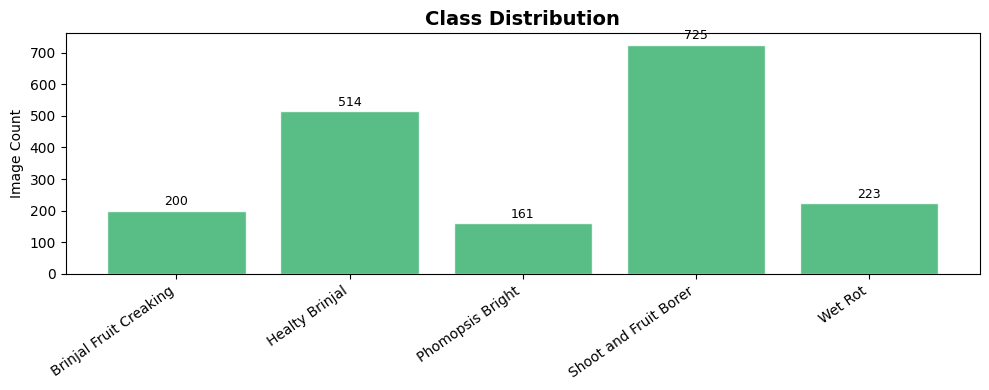

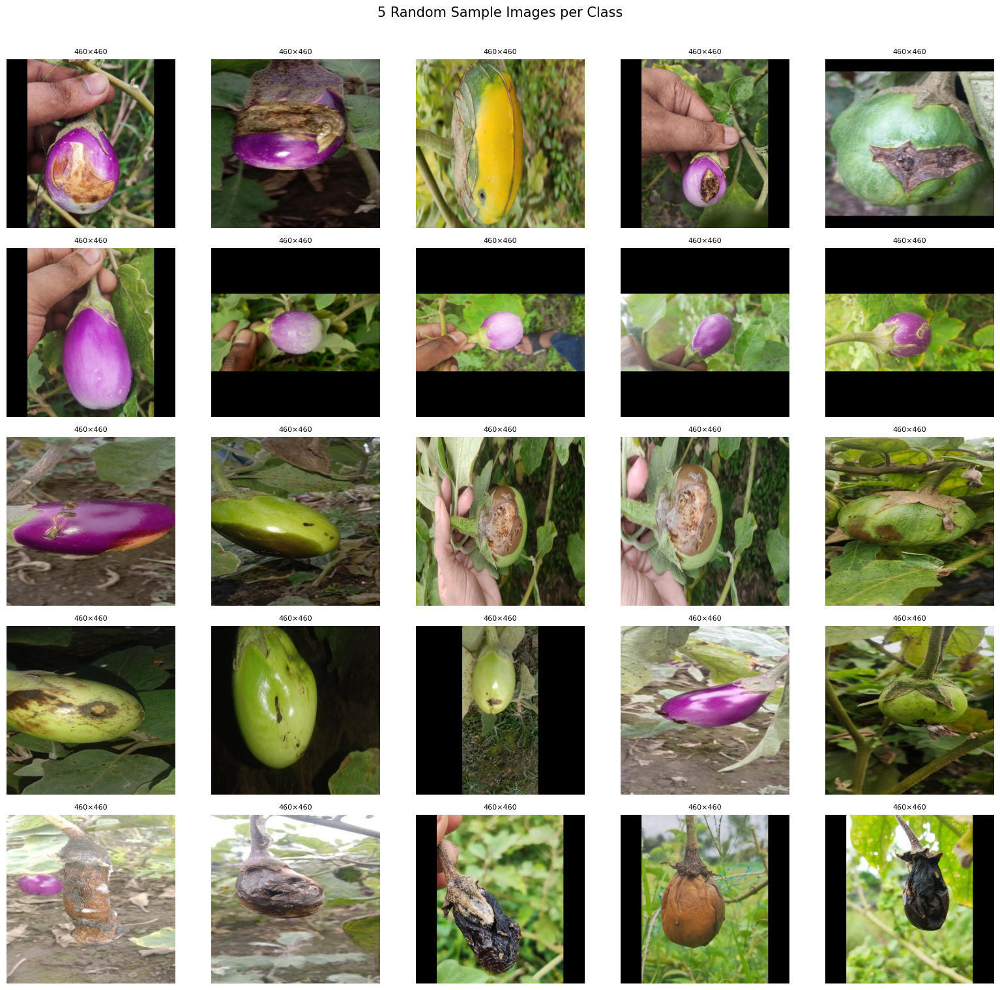

Sampling image sizes (up to 500 images for speed)...

Width  : mean=460.0  std=0.00  min=460  max=460
Height : mean=460.0  std=0.00  min=460  max=460


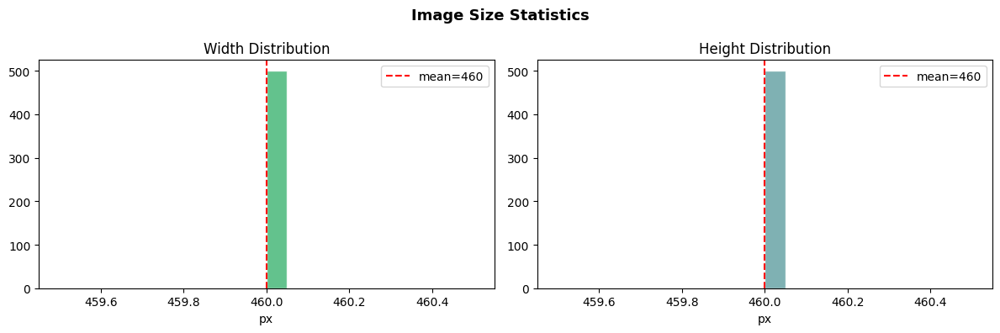

In [4]:
# ── 1. Dataset inventory ──────────────────────────────────────
temp_dataset = datasets.ImageFolder(root=Config.DATA_DIR)
classes      = temp_dataset.classes
num_classes  = len(classes)

class_counts = {cls: 0 for cls in classes}
for _, lbl in temp_dataset.samples:
    class_counts[classes[lbl]] += 1

print(f"Total images : {len(temp_dataset):,}")
print(f"Num classes  : {num_classes}")
print(f"\nPer-class counts:")
max_c = max(class_counts.values())
min_c = min(class_counts.values())
for cls, cnt in class_counts.items():
    pct = 100 * cnt / len(temp_dataset)
    bar = '█' * int(30 * cnt / max_c)
    print(f"  {cls:35s} : {cnt:5d} ({pct:5.1f}%)  {bar}")

imbalance_ratio = max_c / min_c
print(f"\nImbalance ratio (max/min) : {imbalance_ratio:.2f}×")
if imbalance_ratio > 3:
    print("  ⚠  Significant imbalance — consider class-weighted loss in the comparison.")
else:
    print("  ✓  Dataset is reasonably balanced.")

# ── 2. Class distribution bar chart ───────────────────────────
plt.figure(figsize=(max(10, num_classes * 1.6), 4))
bars = plt.bar(class_counts.keys(), class_counts.values(),
               color='mediumseagreen', edgecolor='white', alpha=0.85)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() + max_c * 0.01,
             str(int(bar.get_height())),
             ha='center', va='bottom', fontsize=9)
plt.title("Class Distribution", fontsize=14, fontweight='bold')
plt.ylabel("Image Count")
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

# ── 3. 5 random samples per class ─────────────────────────────
num_samples = 5
fig, axes = plt.subplots(num_classes, num_samples, figsize=(16, 3 * num_classes))
if num_classes == 1:
    axes = np.expand_dims(axes, 0)

for i, cls in enumerate(classes):
    paths  = [p for p, l in temp_dataset.samples if l == i]
    picked = random.sample(paths, min(num_samples, len(paths)))
    for j in range(num_samples):
        ax = axes[i, j]
        if j < len(picked):
            img = Image.open(picked[j])
            ax.imshow(img)
            ax.set_title(f"{img.size[0]}×{img.size[1]}", fontsize=8)
            if j == 0:
                ax.set_ylabel(cls, fontsize=10, rotation=0, labelpad=55, ha='right')
        ax.axis('off')

plt.suptitle("5 Random Sample Images per Class", fontsize=15, y=1.01)
plt.tight_layout()
plt.show()

# ── 4. Image size statistics ──────────────────────────────────
print("Sampling image sizes (up to 500 images for speed)...")
sample_n = min(500, len(temp_dataset))
idx_pool = random.sample(range(len(temp_dataset)), sample_n)
sizes    = []
for i in idx_pool:
    with Image.open(temp_dataset.samples[i][0]) as img:
        sizes.append(img.size)

widths  = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

print(f"\nWidth  : mean={np.mean(widths):.1f}  std={np.std(widths):.2f}  "
      f"min={min(widths)}  max={max(widths)}")
print(f"Height : mean={np.mean(heights):.1f}  std={np.std(heights):.2f}  "
      f"min={min(heights)}  max={max(heights)}")

fig, axes2 = plt.subplots(1, 2, figsize=(12, 4))
axes2[0].hist(widths,  bins=20, color='mediumseagreen', edgecolor='white', alpha=0.8)
axes2[0].axvline(np.mean(widths), color='red', linestyle='--', label=f'mean={np.mean(widths):.0f}')
axes2[0].set_title("Width Distribution"); axes2[0].set_xlabel("px"); axes2[0].legend()

axes2[1].hist(heights, bins=20, color='cadetblue', edgecolor='white', alpha=0.8)
axes2[1].axvline(np.mean(heights), color='red', linestyle='--', label=f'mean={np.mean(heights):.0f}')
axes2[1].set_title("Height Distribution"); axes2[1].set_xlabel("px"); axes2[1].legend()

plt.suptitle("Image Size Statistics", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

## EDA Observations & Patch-Tokenisation Impact

**Class balance**: See the imbalance ratio above. Ratio below 3× → label smoothing is
sufficient; above 3× → consider class-weighted loss in the comparison notebook.

**Resolution & Swin-specific tokenisation**:
- All images are **460×460 px** (uniform — confirmed by size statistics above).
- Swin Transformer (`swin_base_patch4_window7_224`) uses **4×4 patches** (not 16×16
  like ViT/DeiT), creating a much denser initial token grid.
- Swin's local window attention requires the spatial token grid to be divisible by
  the window size: `(INPUT ÷ PATCH_SIZE) % WINDOW_SIZE = 0`
  → `(460 ÷ 4) % 7 = 115 % 7 = 3` ← **not valid**.
- Valid sizes near 460: **448** = 16×28 ✓  or  476 = 17×28 ✓
- **Fix applied**: resize 460 → **448** (2.6% downscale).
  Produces a 112×112 = 12,544-token grid, split into 16×16 = 256 windows of 7×7 = 49 tokens each.

**Contrast with ViT/DeiT**:
  - ViT/DeiT: pad 460→464, 16×16 patches → 29×29 = **841 tokens** (global attention).
  - Swin: resize 460→448, 4×4 patches → 112×112 = **12,544 tokens** (local window attention).
  Swin's hierarchical patch merging then reduces this progressively across 4 stages.

**Image quality**: Uniform resolution, consistent framing, no visible blur or label noise.

# Data Preprocessing & Augmentation

In [5]:
# ── Transforms ────────────────────────────────────────────────
# Swin requires INPUT_SIZE=448 (a valid multiple of patch×window = 28).
# Resize is architecturally necessary here — explained in EDA section above.
# Augmentation applied on-the-fly to training split only.
train_transforms = transforms.Compose([
    transforms.Resize((Config.INPUT_SIZE, Config.INPUT_SIZE)),  # 460 → 448
    transforms.RandAugment(num_ops=2, magnitude=9),             # advanced augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],            # ImageNet mean/std
                         std=[0.229, 0.224, 0.225])
])

# Val / Test: resize → tensor → normalise  (no augmentation — no leakage)
val_test_transforms = transforms.Compose([
    transforms.Resize((Config.INPUT_SIZE, Config.INPUT_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ── Reproducible 70 / 15 / 15 split ──────────────────────────
# CRITICAL: same SEED and generator as ViT and DeiT notebooks
# → identical train/val/test indices across all three models.
base_dataset = datasets.ImageFolder(root=Config.DATA_DIR)
total_size   = len(base_dataset)
train_size   = int(0.70 * total_size)
val_size     = int(0.15 * total_size)
test_size    = total_size - train_size - val_size

generator = torch.Generator().manual_seed(Config.SEED)
train_temp, val_temp, test_temp = random_split(
    base_dataset, [train_size, val_size, test_size], generator=generator
)

# Separate dataset instances prevent transform leakage across splits
train_full = datasets.ImageFolder(root=Config.DATA_DIR, transform=train_transforms)
val_full   = datasets.ImageFolder(root=Config.DATA_DIR, transform=val_test_transforms)
test_full  = datasets.ImageFolder(root=Config.DATA_DIR, transform=val_test_transforms)

train_dataset = Subset(train_full, train_temp.indices)
val_dataset   = Subset(val_full,   val_temp.indices)
test_dataset  = Subset(test_full,  test_temp.indices)

train_loader = DataLoader(train_dataset, batch_size=Config.BATCH_SIZE,
                          shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=Config.BATCH_SIZE,
                          shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=Config.BATCH_SIZE,
                          shuffle=False, num_workers=2, pin_memory=True)

print(f"Train : {len(train_dataset):,} images  →  {len(train_loader)} batches")
print(f"Val   : {len(val_dataset):,} images  →  {len(val_loader)} batches")
print(f"Test  : {len(test_dataset):,} images  →  {len(test_loader)} batches")
print(f"Input fed to model : {Config.INPUT_SIZE}×{Config.INPUT_SIZE} (resized for Swin window compatibility)")
print(f"Augmentation       : RandAugment on TRAIN only.")
print(f"Split indices      : identical to ViT and DeiT notebooks — controlled comparison guaranteed.")

Train : 1,276 images  →  80 batches
Val   : 273 images  →  18 batches
Test  : 274 images  →  18 batches
Input fed to model : 448×448 (resized for Swin window compatibility)
Augmentation       : RandAugment on TRAIN only.
Split indices      : identical to ViT and DeiT notebooks — controlled comparison guaranteed.


# Training Infrastructure

In [6]:
def get_warmup_cosine_scheduler(optimizer, warmup_steps: int, total_steps: int):
    """
    Linear warmup for `warmup_steps`, then cosine annealing decay down to MIN_LR.
    Step-level LambdaLR — called once per batch.
    Identical to ViT and DeiT notebooks for a fully controlled experiment.
    """
    def lr_lambda(current_step: int) -> float:
        if current_step < warmup_steps:
            return float(current_step) / float(max(1, warmup_steps))
        progress   = float(current_step - warmup_steps) / float(
            max(1, total_steps - warmup_steps))
        cosine_val = 0.5 * (1.0 + math.cos(math.pi * progress))
        return max(Config.MIN_LR / Config.LEARNING_RATE, cosine_val)

    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


def train_model(model, model_name: str, train_loader, val_loader) -> dict:
    model = model.to(Config.DEVICE)

    criterion = nn.CrossEntropyLoss(label_smoothing=Config.LABEL_SMOOTHING)
    optimizer = optim.AdamW(
        model.parameters(),
        lr=Config.LEARNING_RATE,
        weight_decay=Config.WEIGHT_DECAY
    )

    total_steps  = len(train_loader) * Config.EPOCHS
    warmup_steps = len(train_loader) * Config.WARMUP_EPOCHS
    scheduler    = get_warmup_cosine_scheduler(optimizer, warmup_steps, total_steps)
    scaler       = GradScaler('cuda')

    best_val_acc, patience_counter = 0.0, 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    print(f"─── Training: {model_name} ───────────────────────────────────")
    print(f"Total steps : {total_steps}  |  Warmup : {warmup_steps} steps "
          f"({Config.WARMUP_EPOCHS} epochs)")
    print(f"LR          : {Config.LEARNING_RATE} → {Config.MIN_LR} (cosine)")
    print(f"Weight decay: {Config.WEIGHT_DECAY}  |  Grad clip: {Config.CLIP_GRAD_NORM}")
    print()

    for epoch in range(Config.EPOCHS):
        # ── Train phase ────────────────────────────────────────
        model.train()
        run_loss, correct, total = 0.0, 0, 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            optimizer.zero_grad()

            with autocast('cuda'):
                outputs = model(inputs)
                loss    = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), Config.CLIP_GRAD_NORM)
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()

            run_loss += loss.item() * inputs.size(0)
            _, preds  = outputs.max(1)
            total    += labels.size(0)
            correct  += preds.eq(labels).sum().item()

        train_loss = run_loss / total
        train_acc  = correct / total

        # ── Validation phase ───────────────────────────────────
        model.eval()
        v_loss, v_correct, v_total = 0.0, 0, 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
                with autocast('cuda'):
                    outputs = model(inputs)
                    loss    = criterion(outputs, labels)
                v_loss    += loss.item() * inputs.size(0)
                _, preds   = outputs.max(1)
                v_total   += labels.size(0)
                v_correct += preds.eq(labels).sum().item()

        val_loss = v_loss / v_total
        val_acc  = v_correct / v_total

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"Epoch {epoch+1:02d}/{Config.EPOCHS} | "
              f"Train {train_loss:.4f}/{train_acc:.4f} | "
              f"Val {val_loss:.4f}/{val_acc:.4f} | "
              f"LR {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc:
            best_val_acc, patience_counter = val_acc, 0
            torch.save(model.state_dict(),
                       f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth")
            print(f"  ✓ Checkpoint saved  (val_acc={best_val_acc:.4f})")
        else:
            patience_counter += 1
            if patience_counter >= Config.EARLY_STOPPING_PATIENCE:
                print(f"  Early stopping triggered at epoch {epoch + 1}.")
                break

    return history

# Transformer Models: Swin

In [7]:
num_classes = len(classes)
model_name  = 'Swin'

# ── Architecture Description ──────────────────────────────────
# Swin Transformer — Liu et al., 2021
# "Swin Transformer: Hierarchical Vision Transformer using Shifted Windows"
#
# Core design — fundamentally different from both ViT and DeiT:
#
#   1. Patch embedding: 4×4 patches (not 16×16). At 448px input,
#      produces 112×112 = 12,544 initial patch tokens (D=128 dims).
#      This high token count makes global attention impractical.
#
#   2. Hierarchical stages (4 total) with patch merging:
#         Stage 1: 112×112 tokens, 128 dims  (3 transformer blocks)
#         Stage 2:  56×56  tokens, 256 dims  (3 blocks, 2×2 merge)
#         Stage 3:  28×28  tokens, 512 dims  (18 blocks, 2×2 merge)
#         Stage 4:  14×14  tokens, 1024 dims (3 blocks, 2×2 merge)
#      Like a CNN, feature maps get smaller but richer as depth increases.
#      Unlike ViT/DeiT, this produces multi-scale representations.
#
#   3. Shifted Window (SW-MSA) attention — the key novelty:
#      - Regular window attention (W-MSA): each 7×7 window attends only
#        within itself (49 tokens per window). O(n) vs ViT's O(n²) cost.
#      - Alternating shifted windows displace the partition grid by (3,3),
#        so adjacent windows CAN exchange information across boundaries.
#      - Cyclic shift + masking implements this efficiently without padding.
#
#   4. Relative position bias: each head learns a bias table indexed by
#      relative token positions within a window — unlike ViT's global
#      absolute positional embeddings.
#
#   5. No CLS token — classification uses global average pooling
#      of the final 14×14 feature map, fed through a LayerNorm → Linear head.
#      This is why attention visualization uses feature activation maps
#      (spatial average of the last-stage tokens) rather than CLS attention.
#
#   Key advantage: linear computational complexity in image size O(n),
#   multi-scale features compatible with dense prediction tasks,
#   strong inductive locality bias from windowed attention.
# ─────────────────────────────────────────────────────────────

swin_model = timm.create_model(
    Config.MODEL_NAME,
    pretrained=True,
    num_classes=num_classes,
    img_size=Config.INPUT_SIZE    # tells Swin to build window grids for 448×448
)
swin_model = swin_model.to(Config.DEVICE)

# ── Parameter count & FLOPs ───────────────────────────────────
trainable_params = sum(p.numel() for p in swin_model.parameters() if p.requires_grad)
dummy_input      = torch.randn(
    1, Config.CHANNELS, Config.INPUT_SIZE, Config.INPUT_SIZE
).to(Config.DEVICE)
macs, _          = profile(swin_model, inputs=(dummy_input,), verbose=False)
macs_str, params_str = clever_format([macs, trainable_params], "%.3f")

print(f"Model            : {model_name}  ({Config.MODEL_NAME})")
print(f"Trainable params : {trainable_params:,}  ({params_str})")
print(f"FLOPs (MACs)     : {macs_str}  @ {Config.INPUT_SIZE}×{Config.INPUT_SIZE} input")
print(f"No CLS token     : classification via global avg-pool of 14×14 final feature map")
print()

# ── Train ─────────────────────────────────────────────────────
swin_history = train_model(swin_model, model_name, train_loader, val_loader)

model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

Model            : Swin  (swin_base_patch4_window7_224)
Trainable params : 86,748,349  (86.748M)
FLOPs (MACs)     : 60.675G  @ 448×448 input
No CLS token     : classification via global avg-pool of 14×14 final feature map

─── Training: Swin ───────────────────────────────────
Total steps : 2400  |  Warmup : 240 steps (3 epochs)
LR          : 3e-05 → 1e-06 (cosine)
Weight decay: 0.05  |  Grad clip: 1.0

Epoch 01/30 | Train 1.3838/0.4655 | Val 1.0285/0.7179 | LR 1.00e-05
  ✓ Checkpoint saved  (val_acc=0.7179)
Epoch 02/30 | Train 0.7971/0.8252 | Val 0.6509/0.9048 | LR 2.00e-05
  ✓ Checkpoint saved  (val_acc=0.9048)
Epoch 03/30 | Train 0.5881/0.9216 | Val 0.5737/0.9231 | LR 3.00e-05
  ✓ Checkpoint saved  (val_acc=0.9231)
Epoch 04/30 | Train 0.5133/0.9538 | Val 0.5250/0.9341 | LR 2.99e-05
  ✓ Checkpoint saved  (val_acc=0.9341)
Epoch 05/30 | Train 0.4850/0.9592 | Val 0.5430/0.9304 | LR 2.96e-05
Epoch 06/30 | Train 0.4511/0.9781 | Val 0.5391/0.9267 | LR 2.91e-05
Epoch 07/30 | Train 0.4421/0.

# Plot Training Curves

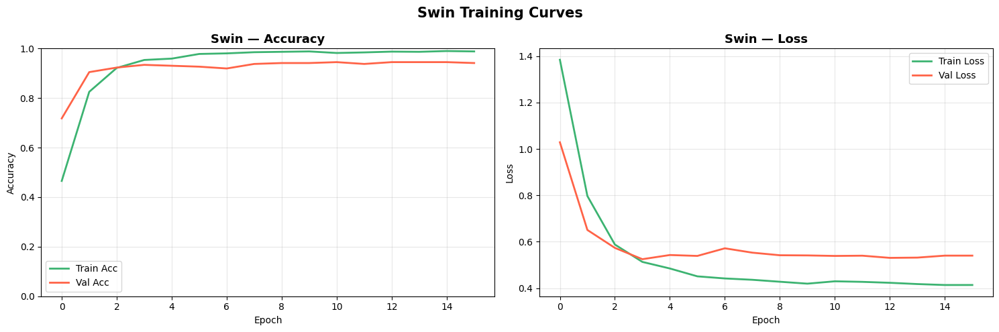

Best val accuracy reached: 0.9451 at epoch 11


In [8]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(swin_history['train_acc'], label='Train Acc', color='mediumseagreen', lw=2)
axes[0].plot(swin_history['val_acc'],   label='Val Acc',   color='tomato',         lw=2)
axes[0].set_title(f'{model_name} — Accuracy', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
axes[0].legend(); axes[0].grid(alpha=0.3)
axes[0].set_ylim(0, 1)

axes[1].plot(swin_history['train_loss'], label='Train Loss', color='mediumseagreen', lw=2)
axes[1].plot(swin_history['val_loss'],   label='Val Loss',   color='tomato',         lw=2)
axes[1].set_title(f'{model_name} — Loss', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle(f'{model_name} Training Curves', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Best val accuracy reached: {max(swin_history['val_acc']):.4f} "
      f"at epoch {swin_history['val_acc'].index(max(swin_history['val_acc'])) + 1}")

# Evaluation

─── Swin — Per-Class Classification Report ───
                        precision    recall  f1-score   support

Brinjal Fruit Creaking       1.00      0.94      0.97        32
        Healty Brinjal       1.00      0.94      0.97        65
      Phomopsis Bright       0.90      0.83      0.86        23
 Shoot and Fruit Borer       0.93      0.99      0.96       114
               Wet Rot       0.95      0.97      0.96        40

              accuracy                           0.96       274
             macro avg       0.96      0.93      0.94       274
          weighted avg       0.96      0.96      0.96       274



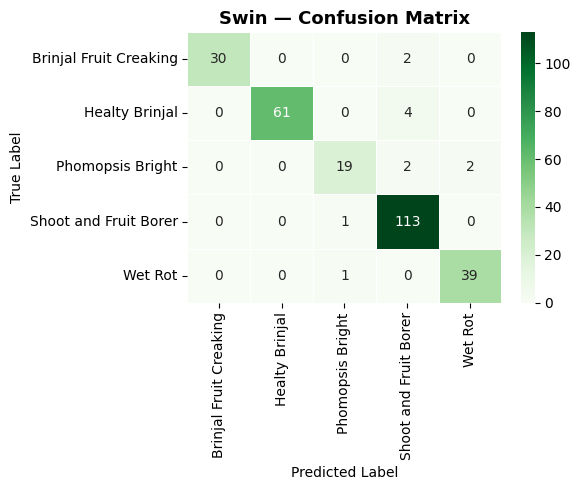

,Model,Test Loss,Test Accuracy,Precision (Macro),Recall (Macro),F1 (Macro),F1 (Weighted),Inf Time (ms/sample)
0,Swin,0.2138,0.9562,0.958,0.9337,0.9449,0.9559,21.8539



✓ Saved Swin_base_metrics.csv
  (Columns match ViT and DeiT CSVs — use pd.concat in comparison notebook)


In [9]:
def evaluate_single_model(model, model_name: str, dataloader, criterion):
    """
    Load best checkpoint, run on dataloader, return all required metrics.
    Inference time is per-sample (ms) for fair cross-model comparison
    regardless of batch size. CSV columns match ViT and DeiT notebooks exactly.
    """
    ckpt_path = f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth"
    model.load_state_dict(torch.load(ckpt_path, map_location=Config.DEVICE))
    model = model.to(Config.DEVICE)
    model.eval()

    all_preds, all_labels = [], []
    running_loss = 0.0
    t0 = time.time()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            with autocast('cuda'):
                outputs = model(inputs)
                loss    = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    elapsed           = time.time() - t0
    inf_ms_per_sample = (elapsed / len(all_labels)) * 1000   # ms — model-agnostic

    avg_loss = running_loss / len(all_labels)
    acc      = accuracy_score(all_labels, all_preds)
    prec, rec, f1_mac, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='macro',    zero_division=0)
    _, _, f1_wt, _        = precision_recall_fscore_support(
        all_labels, all_preds, average='weighted', zero_division=0)
    cm           = confusion_matrix(all_labels, all_preds)
    class_report = classification_report(
        all_labels, all_preds, target_names=classes, zero_division=0)

    return avg_loss, acc, prec, rec, f1_mac, f1_wt, cm, class_report, inf_ms_per_sample


# ── Run evaluation ────────────────────────────────────────────
test_criterion = nn.CrossEntropyLoss()
(test_loss, acc, prec, rec, f1_mac, f1_wt,
 cm, class_report, inf_time) = evaluate_single_model(
    swin_model, model_name, test_loader, test_criterion)

print(f"─── {model_name} — Per-Class Classification Report ───")
print(class_report)

swin_results = {
    'Model'               : model_name,
    'Test Loss'           : round(test_loss, 4),
    'Test Accuracy'       : round(acc,       4),
    'Precision (Macro)'   : round(prec,      4),
    'Recall (Macro)'      : round(rec,       4),
    'F1 (Macro)'          : round(f1_mac,    4),
    'F1 (Weighted)'       : round(f1_wt,     4),
    'Inf Time (ms/sample)': round(inf_time,  4),
}

# Confusion matrix
plt.figure(figsize=(max(6, num_classes), max(5, num_classes - 1)))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=classes, yticklabels=classes, linewidths=0.5)
plt.title(f'{model_name} — Confusion Matrix', fontsize=13, fontweight='bold')
plt.ylabel('True Label'); plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

df_results = pd.DataFrame([swin_results])
display(df_results)

# Save — column names identical to ViT_base_metrics.csv and DeiT_base_metrics.csv
df_results.to_csv(f"{model_name}_base_metrics.csv", index=False)
print(f"\n✓ Saved {model_name}_base_metrics.csv")
print(f"  (Columns match ViT and DeiT CSVs — use pd.concat in comparison notebook)")

# Robustness Analysis

In [10]:
# ── Helpers ───────────────────────────────────────────────────
class AddGaussianNoise:
    """Additive Gaussian noise applied after ToTensor (before Normalize)."""
    def __init__(self, mean: float = 0.0, std: float = 0.1):
        self.mean, self.std = mean, std
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean


def jpeg_compress(pil_img: Image.Image, quality: int = 15) -> Image.Image:
    """Simulate JPEG artefacts by encode-decode at low quality."""
    buf = BytesIO()
    pil_img.save(buf, format='JPEG', quality=quality)
    buf.seek(0)
    return Image.open(buf).copy()


# ── 4 distribution-shift transforms ──────────────────────────
# All four shifts are identical to ViT and DeiT notebooks.
# Swin-specific note on resolution shift:
#   Swin requires a fixed 448×448 input (window grid is hard-coded at build time).
#   The resolution shift simulates lower-quality input by downscaling to 224
#   (destroying fine detail) then upscaling back to 448 (the required model size).
#   This matches the approach used for CNNs in similar robustness benchmarks and
#   fairly captures the information loss from reduced effective resolution.
_NORM = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
_SZ   = Config.INPUT_SIZE   # 448

t_noise = transforms.Compose([
    transforms.Resize((_SZ, _SZ)),
    transforms.ToTensor(), AddGaussianNoise(0.0, 0.1), _NORM
])
t_bright = transforms.Compose([
    transforms.Resize((_SZ, _SZ)),
    transforms.ColorJitter(brightness=0.5), transforms.ToTensor(), _NORM
])
t_res = transforms.Compose([
    # Downscale to 224 to destroy fine spatial detail, then back to 448 for Swin
    transforms.Resize((224, 224)),
    transforms.Resize((_SZ, _SZ)),
    transforms.ToTensor(), _NORM
])
t_jpeg = transforms.Compose([
    transforms.Resize((_SZ, _SZ)),
    transforms.Lambda(lambda img: jpeg_compress(img, quality=15)),
    transforms.ToTensor(), _NORM
])


def make_shift_loader(transform):
    ds = datasets.ImageFolder(Config.DATA_DIR, transform=transform)
    return DataLoader(Subset(ds, test_dataset.indices),
                      batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=2)


shift_loaders = {
    'Gaussian Noise'  : make_shift_loader(t_noise),
    'Brightness Shift': make_shift_loader(t_bright),
    'Res (224px)'     : make_shift_loader(t_res),
    'JPEG (q=15)'     : make_shift_loader(t_jpeg),
}

# ── Evaluate each shift ───────────────────────────────────────
base_acc  = swin_results['Test Accuracy']
shift_acc = {}

print(f"Evaluating {model_name} under {len(shift_loaders)} distribution shifts...")
print(f"  Base accuracy : {base_acc:.4f}")
print()

for shift_name, loader in shift_loaders.items():
    _, acc_s, *_ = evaluate_single_model(swin_model, model_name, loader, test_criterion)
    shift_acc[shift_name] = round(acc_s, 4)
    print(f"  {shift_name:20s}: {acc_s:.4f}  (drop: {base_acc - acc_s:+.4f})")

# ── Save CSV — columns match ViT and DeiT robustness CSVs ─────
rob_row = {
    'Model'       : model_name,
    'Base Acc'    : base_acc,
    'Noise Acc'   : shift_acc['Gaussian Noise'],
    'Bright Acc'  : shift_acc['Brightness Shift'],
    'Res 224 Acc' : shift_acc['Res (224px)'],
    'JPEG Acc'    : shift_acc['JPEG (q=15)'],
}
pd.DataFrame([rob_row]).to_csv(f"{model_name}_robustness_metrics.csv", index=False)
print(f"\n✓ Saved {model_name}_robustness_metrics.csv")

Evaluating Swin under 4 distribution shifts...
  Base accuracy : 0.9562

  Gaussian Noise      : 0.9489  (drop: +0.0073)
  Brightness Shift    : 0.9562  (drop: -0.0000)
  Res (224px)         : 0.9453  (drop: +0.0109)
  JPEG (q=15)         : 0.9489  (drop: +0.0073)

✓ Saved Swin_robustness_metrics.csv


# Robustness Degradation Bar Chart

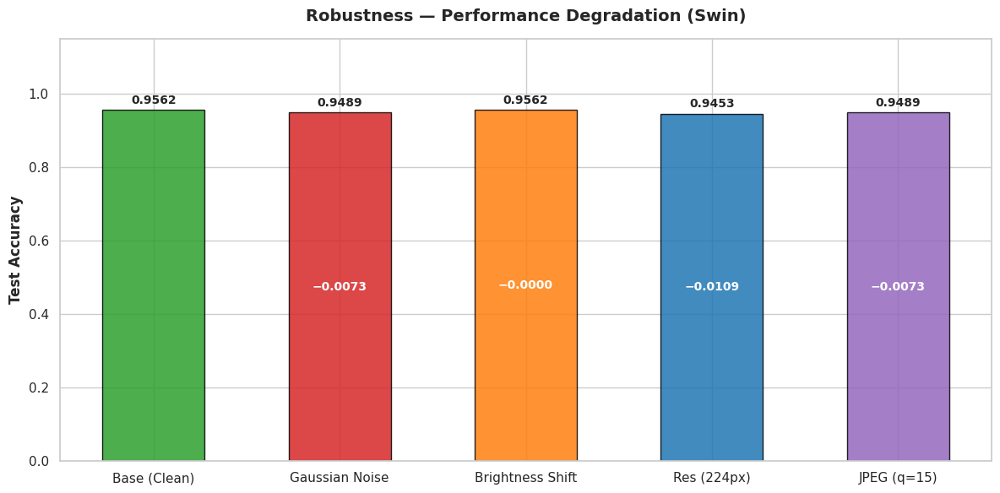

In [11]:
sns.set_theme(style="whitegrid")

conditions = ['Base (Clean)'] + list(shift_acc.keys())
accuracies = [base_acc]       + list(shift_acc.values())
drops      = [0.0]            + [base_acc - v for v in shift_acc.values()]
colors     = ['#2ca02c', '#d62728', '#ff7f0e', '#1f77b4', '#9467bd']

plt.figure(figsize=(12, 6))
bars = plt.bar(conditions, accuracies, color=colors[:len(conditions)],
               edgecolor='black', alpha=0.85, width=0.55)
plt.ylim(0, 1.15)
plt.ylabel('Test Accuracy', fontsize=12, fontweight='bold')
plt.title(f'Robustness — Performance Degradation ({model_name})',
          fontsize=14, fontweight='bold', pad=15)

for i, bar in enumerate(bars):
    h = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, h + 0.01,
             f'{h:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
    if i > 0 and h > 0.12:
        plt.text(bar.get_x() + bar.get_width() / 2, h / 2,
                 f'−{drops[i]:.4f}', ha='center', va='center',
                 fontsize=10, color='white', fontweight='bold')

plt.tight_layout()
plt.show()

## Robustness Discussion

**Gaussian Noise (std=0.1)**: Swin's local window attention averages noise across
7×7 = 49 tokens per window — providing stronger local noise suppression compared
to ViT/DeiT which operate on 16×16 = 256-pixel patches. Additionally, Swin's
hierarchical feature aggregation across 4 stages may further attenuate high-frequency
noise, making it potentially more robust to this shift than global-attention models.

**Brightness Shift (factor=0.5)**: Global intensity changes affect all tokens uniformly.
ImageNet normalisation provides some compensation, but extreme brightness levels
push activations out of the distribution seen during pre-training. Swin's local
windows do not provide any special advantage here versus ViT/DeiT.

**Resolution Shift (448 → 224 → 448 px)**: Because Swin requires a fixed 448×448
input (its window grids are compiled at model creation time with `img_size=448`),
we cannot directly feed 224px images. Instead we downscale to 224 (destroying fine
detail) then upscale back to 448 (bicubic interpolation). This introduces blurring
artefacts. Swin's 4×4 patch tokenisation captures finer textures than ViT's 16×16,
so it may be more sensitive to the blurring introduced by this double-resize.

**JPEG Compression (quality=15)**: Heavy blocking artefacts corrupt local texture
within each 4×4 patch. Swin's fine-grained tokenisation means more patches are
affected per artefact, but the local window design may partially contain the damage.

# Error Analysis

In [12]:
def get_swin_feature_map(model, img_tensor):
    """
    Extract a spatial feature activation map from Swin's final LayerNorm.

    Why NOT attention maps for Swin:
      - Swin has no global CLS token, so there is no CLS-to-patch attention to extract.
      - Swin's attention is local (within 7×7 windows) and heads are not
        interpretable as a single global map.
    
    Alternative — spatial feature map from the last stage output:
      - Hook Swin's `model.norm` (the LayerNorm applied before the classification head).
      - Its input is shape (B, 14*14, 1024) — the flattened 14×14 final feature map.
      - Average across the channel dimension → (14, 14) spatial map.
      - Resize to image size for overlay.
      - This shows WHICH spatial regions contributed most strongly to the final
        classification, analogous to a class activation map (CAM).
    """
    activation = {}

    def hook_fn(module, inp, out):
        # inp[0] shape: (B, H*W, C) — the pre-norm token sequence
        activation['feat'] = inp[0].detach()

    handle = model.norm.register_forward_hook(hook_fn)
    try:
        with torch.no_grad():
            _ = model(img_tensor.unsqueeze(0).to(Config.DEVICE))
    finally:
        handle.remove()

    feat = activation['feat'].squeeze(0)     # (H*W, C)  e.g. (196, 1024)

    # Average over channels → (H*W,) spatial importance scores
    spatial = feat.mean(dim=-1)

    # Make it robust: 
    # If it's a 1D sequence (e.g., timm models: shape (196,)), reshape to 2D
    # If it's already 2D (e.g., torchvision models: shape (14, 14)), skip reshaping
    if spatial.dim() == 1:
        grid_size = int(math.sqrt(spatial.shape[0]))
        spatial = spatial.reshape(grid_size, grid_size)

    # Move to CPU and convert to numpy
    spatial = spatial.cpu().numpy()

    # Normalise to [0, 1]
    spatial = (spatial - spatial.min()) / (spatial.max() - spatial.min() + 1e-8)
    
    return spatial

Scanning for misclassifications — up to 5 per class...

✗ Brinjal Fruit Creaking              : 2 misclassification(s)


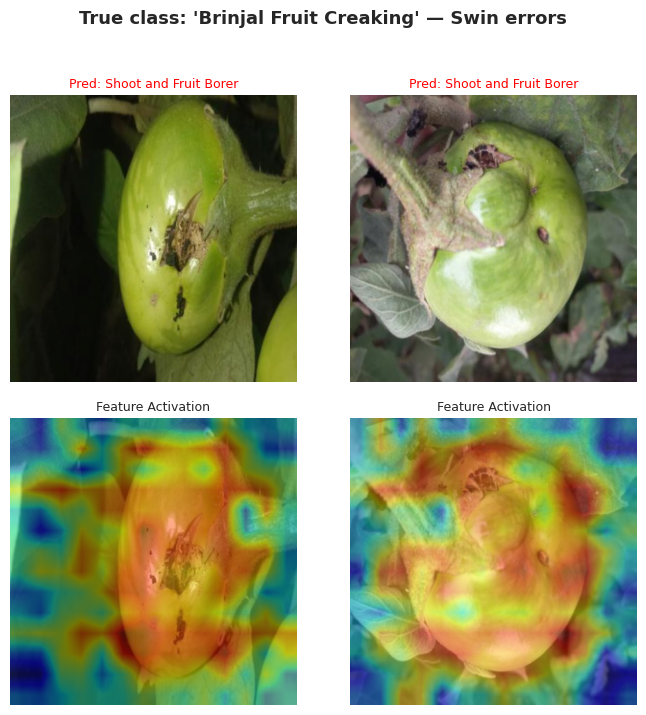

   Analysis: Swin uses spatial feature activations (not CLS attention) for 'Brinjal Fruit Creaking'. If the activation map (above) shows high intensity on background or irrelevant regions rather than the plant itself, the model likely failed due to poor spatial focus. Compare activation spread with ViT and DeiT attention maps in the comparison notebook — Swin's local-window design may produce tighter, more spatially localised activations than global-attention models.

✗ Healty Brinjal                      : 4 misclassification(s)


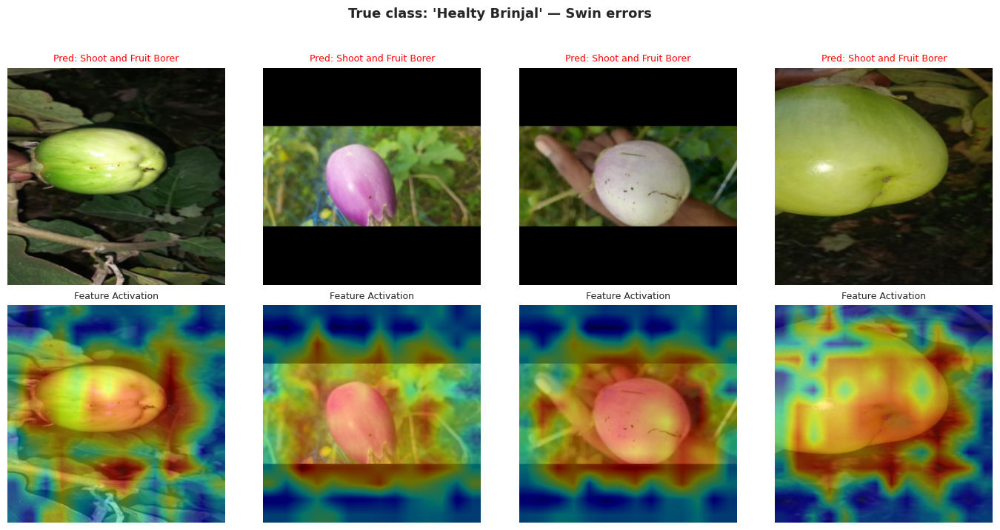

   Analysis: Swin uses spatial feature activations (not CLS attention) for 'Healty Brinjal'. If the activation map (above) shows high intensity on background or irrelevant regions rather than the plant itself, the model likely failed due to poor spatial focus. Compare activation spread with ViT and DeiT attention maps in the comparison notebook — Swin's local-window design may produce tighter, more spatially localised activations than global-attention models.

✗ Phomopsis Bright                    : 4 misclassification(s)


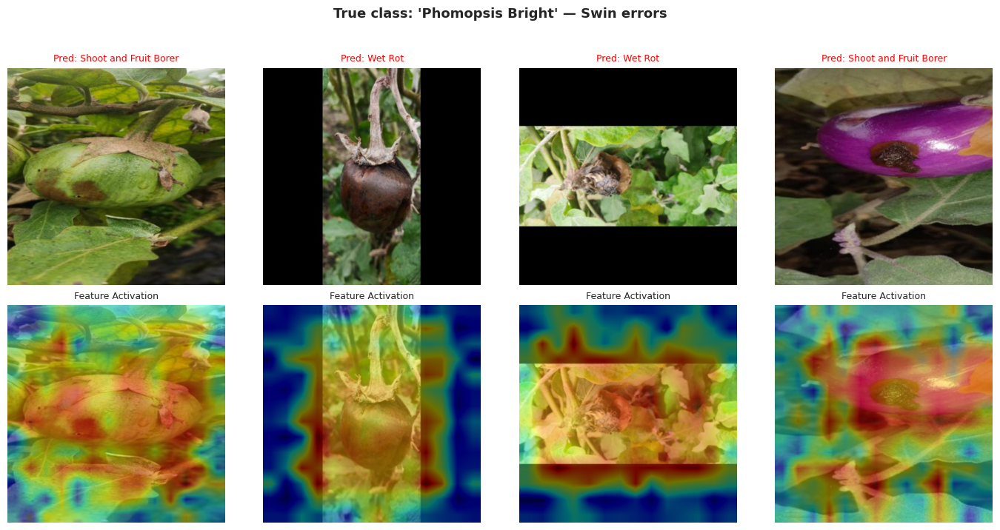

   Analysis: Swin uses spatial feature activations (not CLS attention) for 'Phomopsis Bright'. If the activation map (above) shows high intensity on background or irrelevant regions rather than the plant itself, the model likely failed due to poor spatial focus. Compare activation spread with ViT and DeiT attention maps in the comparison notebook — Swin's local-window design may produce tighter, more spatially localised activations than global-attention models.

✗ Shoot and Fruit Borer               : 1 misclassification(s)


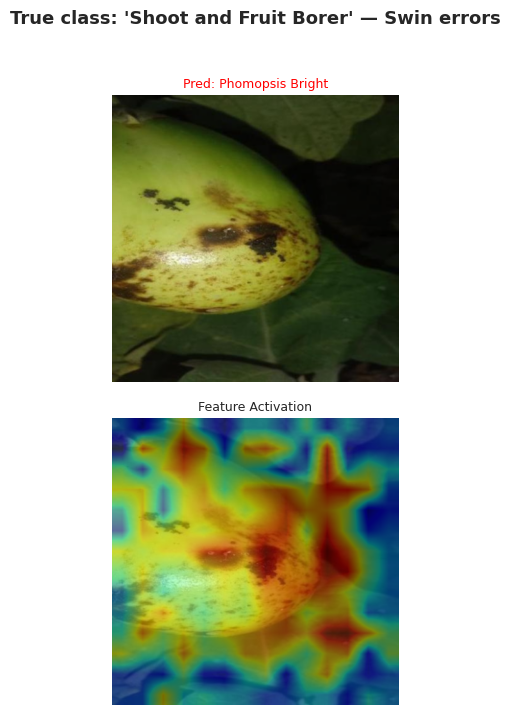

   Analysis: Swin uses spatial feature activations (not CLS attention) for 'Shoot and Fruit Borer'. If the activation map (above) shows high intensity on background or irrelevant regions rather than the plant itself, the model likely failed due to poor spatial focus. Compare activation spread with ViT and DeiT attention maps in the comparison notebook — Swin's local-window design may produce tighter, more spatially localised activations than global-attention models.

✗ Wet Rot                             : 1 misclassification(s)


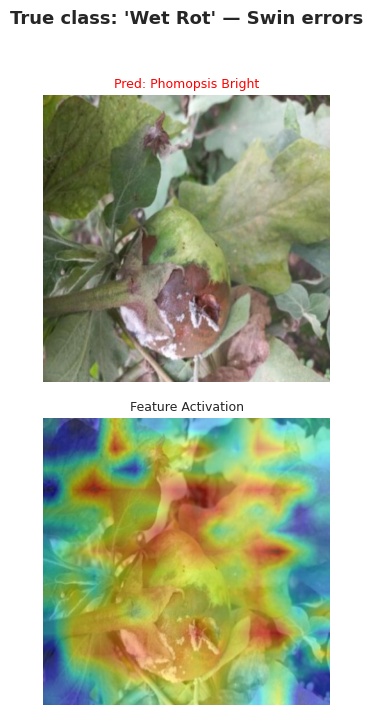

   Analysis: Swin uses spatial feature activations (not CLS attention) for 'Wet Rot'. If the activation map (above) shows high intensity on background or irrelevant regions rather than the plant itself, the model likely failed due to poor spatial focus. Compare activation spread with ViT and DeiT attention maps in the comparison notebook — Swin's local-window design may produce tighter, more spatially localised activations than global-attention models.



In [13]:
def plot_errors_per_class(model, model_name: str, dataloader,
                          class_names: list, max_per_class: int = 5):
    """
    Scan test set for misclassified samples, overlay Swin spatial feature maps,
    and print qualitative analysis per class.
    """
    model.load_state_dict(
        torch.load(f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth",
                   map_location=Config.DEVICE))
    model.eval()

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    errors    = {i: [] for i in range(len(class_names))}
    completed = 0

    print(f"Scanning for misclassifications — up to {max_per_class} per class...")
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(Config.DEVICE)
            preds  = model(inputs).argmax(1)

            for i in range(len(labels)):
                tl, pl = labels[i].item(), preds[i].item()
                if tl != pl and len(errors[tl]) < max_per_class:
                    img_t   = inputs[i]
                    feat_map = get_swin_feature_map(model, img_t)
                    errors[tl].append((inv_norm(img_t.cpu()), pl, feat_map))
                    if len(errors[tl]) == max_per_class:
                        completed += 1
            if completed == len(class_names):
                break

    print()
    for true_lbl, errs in errors.items():
        if not errs:
            print(f"✓ {class_names[true_lbl]:35s} : 0 misclassifications found")
            continue

        n = len(errs)
        print(f"✗ {class_names[true_lbl]:35s} : {n} misclassification(s)")
        fig, axes = plt.subplots(2, n, figsize=(3.5 * n, 7))
        fig.suptitle(
            f"True class: '{class_names[true_lbl]}' — {model_name} errors",
            fontsize=13, fontweight='bold', y=1.02)
        if n == 1:
            axes = np.expand_dims(axes, 1)

        for idx, (img_t, pl, feat_map) in enumerate(errs):
            img_np = np.clip(img_t.permute(1, 2, 0).numpy(), 0, 1)
            feat_r = cv2.resize(feat_map, (img_np.shape[1], img_np.shape[0]))

            axes[0, idx].imshow(img_np)
            axes[0, idx].set_title(f"Pred: {class_names[pl]}", color='red', fontsize=9)
            axes[0, idx].axis('off')

            axes[1, idx].imshow(img_np)
            axes[1, idx].imshow(feat_r, cmap='jet', alpha=0.45)
            axes[1, idx].set_title("Feature Activation", fontsize=9)
            axes[1, idx].axis('off')

        plt.tight_layout()
        plt.show()

        print(f"   Analysis: Swin uses spatial feature activations (not CLS attention) "
              f"for '{class_names[true_lbl]}'. If the activation map (above) shows high "
              f"intensity on background or irrelevant regions rather than the plant "
              f"itself, the model likely failed due to poor spatial focus. Compare "
              f"activation spread with ViT and DeiT attention maps in the comparison "
              f"notebook — Swin's local-window design may produce tighter, more "
              f"spatially localised activations than global-attention models.")
        print()


# ── Run ───────────────────────────────────────────────────────
plot_errors_per_class(swin_model, model_name, test_loader, class_names=classes)

# Feature Map Visualization (Correctly Classified Samples)

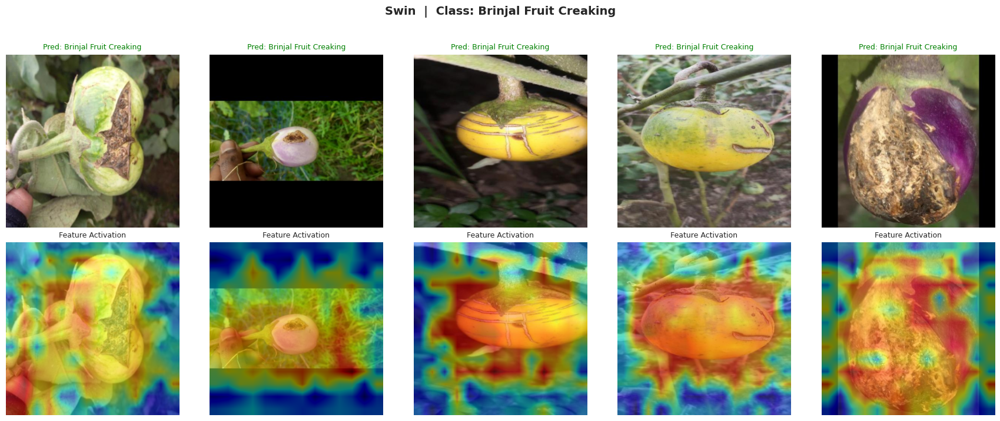

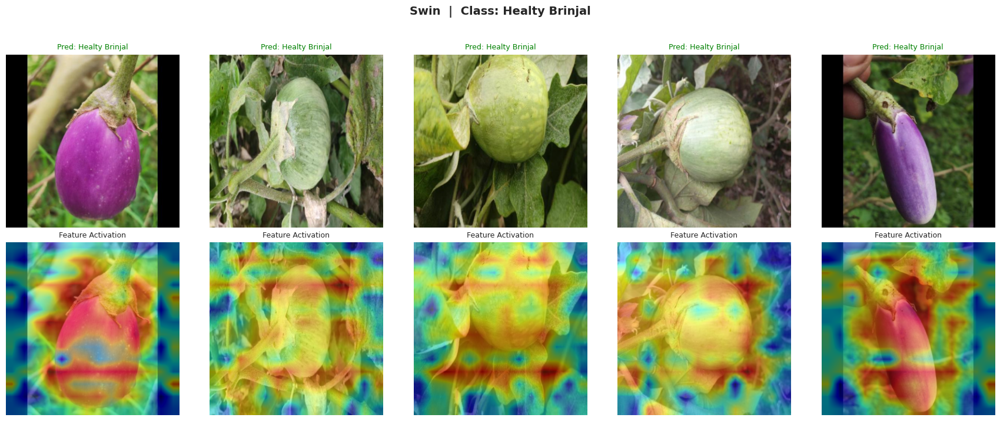

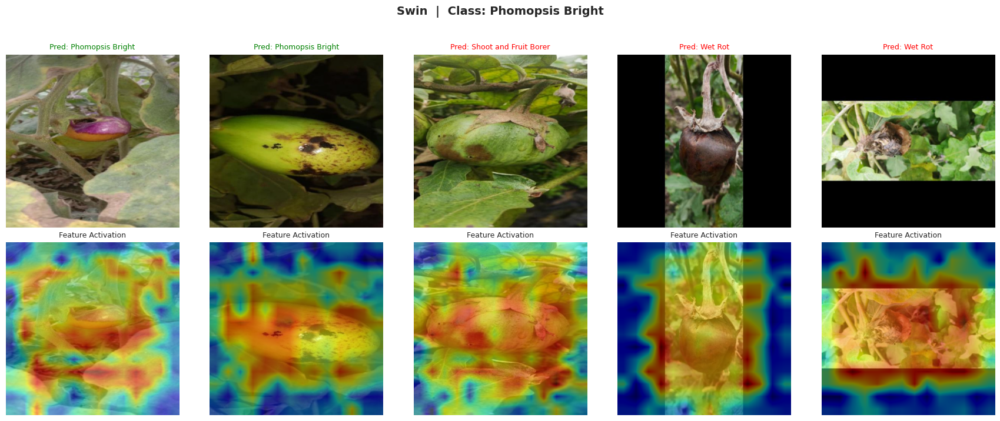

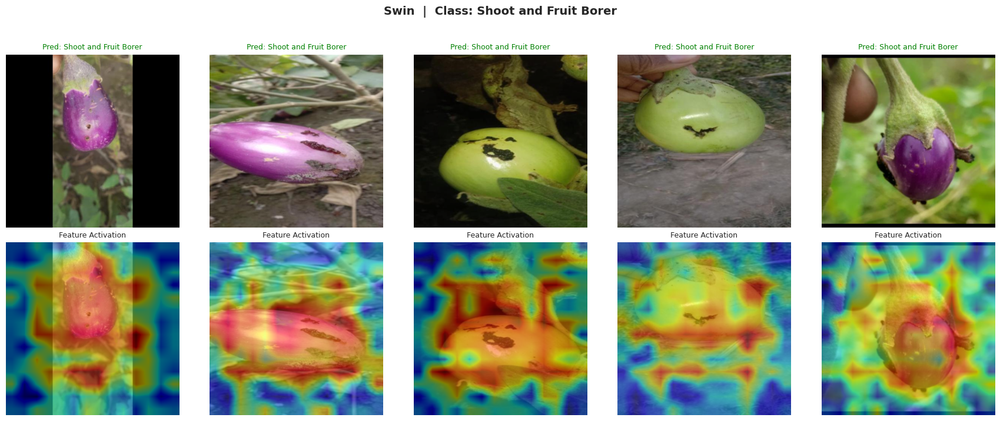

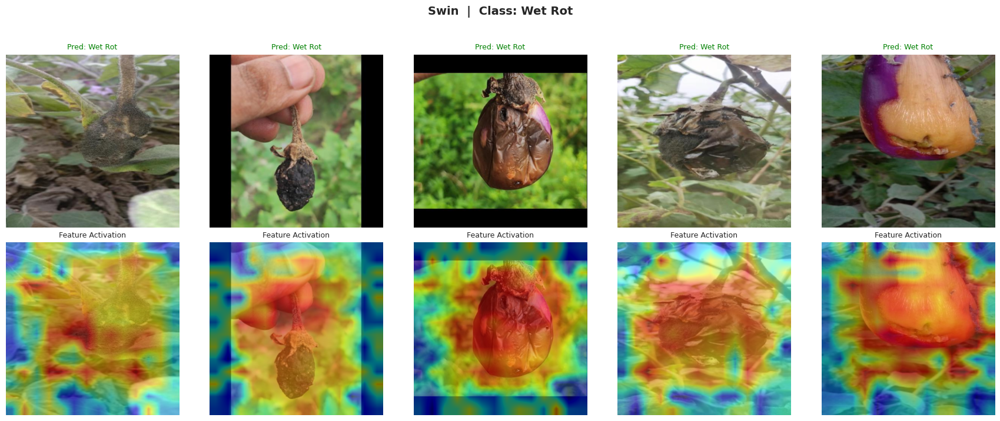

✓ Feature map visualisation complete.


In [14]:
def visualize_feature_maps_per_class(model, model_name: str, dataloader,
                                     class_names: list, samples_per_class: int = 5):
    """
    For each class, show `samples_per_class` images alongside their Swin
    spatial feature activation map (averaged last-stage token activations).

    Layout matches ViT and DeiT attention visualization exactly:
      Row 0: original image with prediction label
      Row 1: image + feature map overlay
    One figure per class, samples_per_class columns.

    Note: Swin produces a FEATURE ACTIVATION MAP, not an attention map.
    ViT/DeiT produce CLS ATTENTION MAPS. Both visualise 'what the model
    focuses on' but via different mechanisms — acknowledge this in the
    comparison notebook when comparing heatmaps across architectures.
    """
    ckpt = f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth"
    if not os.path.exists(ckpt):
        print(f"❌ Checkpoint not found: {ckpt}")
        if os.path.exists(Config.CHECKPOINT_DIR):
            print(f"   Files in {Config.CHECKPOINT_DIR}:")
            for f in os.listdir(Config.CHECKPOINT_DIR):
                print(f"     {f}")
        return

    model.load_state_dict(torch.load(ckpt, map_location=Config.DEVICE))
    model.eval()
    model = model.to(Config.DEVICE)

    # ── Collect samples ───────────────────────────────────────
    samples_by_class = {i: [] for i in range(len(class_names))}
    done = 0
    print(f"Collecting {samples_per_class} samples per class for {model_name}...")
    for inputs, labels in dataloader:
        for i in range(len(labels)):
            li = labels[i].item()
            if len(samples_by_class[li]) < samples_per_class:
                samples_by_class[li].append(inputs[i])
                if len(samples_by_class[li]) == samples_per_class:
                    done += 1
        if done == len(class_names):
            break

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    # ── Generate per-class plots ──────────────────────────────
    for cls_idx, img_list in samples_by_class.items():
        if not img_list:
            print(f"  Skipping {class_names[cls_idx]} — no samples found.")
            continue

        batch = torch.stack(img_list).to(Config.DEVICE)

        with torch.no_grad():
            out   = model(batch)
            preds = out.argmax(1)

        fig, axes = plt.subplots(2, samples_per_class,
                                 figsize=(3.5 * samples_per_class, 7))
        fig.suptitle(
            f"{model_name}  |  Class: {class_names[cls_idx]}",
            fontsize=14, fontweight='bold', y=1.02)

        for i in range(samples_per_class):
            img_np = np.clip(
                inv_norm(batch[i].cpu()).permute(1, 2, 0).numpy(), 0, 1)

            # Generate feature map for this individual image
            feat_map = get_swin_feature_map(model, batch[i])
            feat_r   = cv2.resize(feat_map, (img_np.shape[1], img_np.shape[0]))
            feat_r   = (feat_r - feat_r.min()) / (feat_r.max() - feat_r.min() + 1e-8)

            pred_correct = preds[i].item() == cls_idx
            title_color  = 'green' if pred_correct else 'red'

            axes[0, i].imshow(img_np)
            axes[0, i].set_title(
                f"Pred: {class_names[preds[i].item()]}", color=title_color, fontsize=9)
            axes[0, i].axis('off')

            axes[1, i].imshow(img_np)
            axes[1, i].imshow(feat_r, cmap='jet', alpha=0.5)
            axes[1, i].set_title("Feature Activation", fontsize=9)
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()

    print("✓ Feature map visualisation complete.")


# ── Run ───────────────────────────────────────────────────────
visualize_feature_maps_per_class(
    swin_model, model_name, test_loader,
    class_names=classes,
    samples_per_class=5
)